In [2]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
import glob
from PIL import Image
img_path = glob.glob("F:/GWU/2022 Spring/STAT 6289/HW/final/data/ukiyoe-1024/*.jpg")
path_save = "F:\GWU\2022 Spring\STAT 6289\HW\final\data\predata"
for file in img_path: 
    name = os.path.join(path_save,file)
    img = Image.open(file)
    img.thumbnail((96,96))
    print(img.format, img.size, img.mode)
    img.save(name,'JPEG')

In [3]:
seed = 3999
random.seed(seed)
torch.manual_seed(seed)

In [4]:
dataroot = "/content/drive/MyDrive/datas"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 512


image_size = 64

# color images 
nc = 3

# Size of z  
nz = 100

#feature maps 
ngf = 64

#feature maps 
ndf = 64

# training epochs
num_epochs = 100 

# Learning rate 
lr = 0.0002

# Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
numgpu = 1

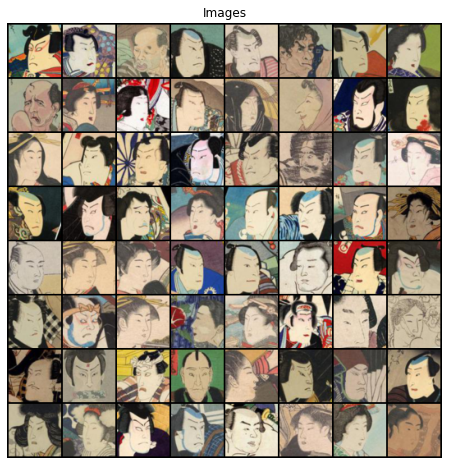

In [5]:


dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.RandomHorizontalFlip(),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)


if torch.cuda.is_available() and numgpu > 0:
    device = torch.device('cuda:0')
else:
    device = torch.device("cpu")


real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
# Generator Code
class convTranspose(nn.Module):
    def __init__(self, inp, out, kernel_size, strides, padding):
        super(convTranspose, self).__init__()
        
        self.main = nn.Sequential(
            nn.ConvTranspose2d(inp, out, kernel_size, strides, padding, bias=False),
            nn.BatchNorm2d(out),
            nn.ReLU(True))
        
    def forward(self, x):
        return self.main(x)
    
class Generator(nn.Module):
    def __init__(self, numgpu):
        super(Generator, self).__init__()
        self.numgpu = numgpu
        self.main = nn.Sequential(
          
            
            convTranspose(nz, ngf * 8, 4, 2, 0),
            
            convTranspose(ngf * 8, ngf * 4, 4, 2, 1),
            
            convTranspose(ngf * 4, ngf * 2, 4, 2, 1),
            
            convTranspose(ngf * 2, ngf, 4, 2, 1),
            
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            nn.Tanh()
          
        )

    def forward(self, x):
        return self.main(x)

In [8]:
netG = Generator(numgpu).to(device)


if (device.type == 'cuda') and (numgpu > 1):
    netG = nn.DataParallel(netG, list(range(numgpu)))

netG.apply(weights_init)


print(netG)

Generator(
  (main): Sequential(
    (0): convTranspose(
      (main): Sequential(
        (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(2, 2), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): convTranspose(
      (main): Sequential(
        (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (2): convTranspose(
      (main): Sequential(
        (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (3): convTranspose(
      (main): Sequential(
        (0): ConvTranspose2d(128, 64, kernel_size=(4, 4),

In [12]:
class Cond2dBatch(nn.Module):
    def __init__(self, inp, out, kernel_size, strides, padding):
        super(Cond2dBatch, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(inp, out, kernel_size, strides, padding, bias=False),
            nn.BatchNorm2d(out),
            nn.ReLU(True))
        
    def forward(self, x):
        return self.main(x)


class Discriminator(nn.Module):
    def __init__(self, numgpu):
        super(Discriminator, self).__init__()
        self.numgpu = numgpu
        self.main = nn.Sequential(
            
            nn.Conv2d(nc, ndf, 4, 2, 1),
            
            
            Cond2dBatch(ndf, ndf * 2, 4, 2, 1),
            
            Cond2dBatch(ndf * 2, ndf * 4, 4, 2, 1),
            
            Cond2dBatch(ndf * 4, ndf * 8, 4, 2, 1),
           
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),

            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [13]:
# Create the Discriminator
netD = Discriminator(numgpu).to(device)


if (device.type == 'cuda') and (numgpu > 1):
    netD = nn.DataParallel(netD, list(range(numgpu)))


netD.apply(weights_init)


print(netD) 

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): Cond2dBatch(
      (main): Sequential(
        (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (2): Cond2dBatch(
      (main): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (3): Cond2dBatch(
      (main): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (4): Conv2d(512, 1, kernel_size=(4, 4), str

In [14]:

criterion = nn.BCELoss()


fixed_noise = torch.randn(64, nz, 1, 1, device=device)


real_label = 1.
fake_label = 0.


optD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [15]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

In [17]:
# Training 

print("Starting Training Loop...")

for epoch in range(num_epochs):
   
    for i, data in enumerate(dataloader, 0):

        
        
        netD.zero_grad()
        
        real_gpu = data[0].to(device)
        b_size = real_gpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        output = netD(real_gpu).view(-1)
        
        errD_real = criterion(output, label)
        
        errD_real.backward()
        D_x = output.mean().item()

      
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        
        fake = netG(noise)
        label.fill_(fake_label)
        
        output = netD(fake.detach()).view(-1)
        
        errD_fake = criterion(output, label)
        
        errD_fake.backward()
        D_G_z1 = output.mean().item()
       
        errD = errD_real + errD_fake
        
        optD.step()

       
       
        
        netG.zero_grad()
        label.fill_(real_label)  
        
        output = netD(fake).view(-1)
       
        errG = criterion(output, label)
        
        errG.backward()
        D_G_z2 = output.mean().item()
       
        optG.step()

        
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # r
        G_losses.append(errG.item())
        D_losses.append(errD.item())
      
       
        if (iters % 300 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/100][0/11]	Loss_D: 2.6427	Loss_G: 4.9418	D(x): 0.9871	D(G(z)): 0.9025 / 0.0100
[1/100][0/11]	Loss_D: 0.0992	Loss_G: 9.2665	D(x): 0.9422	D(G(z)): 0.0043 / 0.0001
[2/100][0/11]	Loss_D: 0.0639	Loss_G: 7.7247	D(x): 0.9913	D(G(z)): 0.0507 / 0.0005
[3/100][0/11]	Loss_D: 0.9878	Loss_G: 26.9740	D(x): 0.6333	D(G(z)): 0.0000 / 0.0000
[4/100][0/11]	Loss_D: 0.0461	Loss_G: 5.9439	D(x): 0.9891	D(G(z)): 0.0151 / 0.0072
[5/100][0/11]	Loss_D: 2.9940	Loss_G: 18.0857	D(x): 0.8931	D(G(z)): 0.8401 / 0.0000
[6/100][0/11]	Loss_D: 0.6946	Loss_G: 4.5334	D(x): 0.8547	D(G(z)): 0.2569 / 0.0343
[7/100][0/11]	Loss_D: 0.6026	Loss_G: 3.7441	D(x): 0.7638	D(G(z)): 0.1196 / 0.0617
[8/100][0/11]	Loss_D: 0.5160	Loss_G: 6.9326	D(x): 0.9459	D(G(z)): 0.3255 / 0.0025
[9/100][0/11]	Loss_D: 0.4565	Loss_G: 4.8779	D(x): 0.8737	D(G(z)): 0.2042 / 0.0176
[10/100][0/11]	Loss_D: 0.5502	Loss_G: 3.8271	D(x): 0.7902	D(G(z)): 0.1681 / 0.0443
[11/100][0/11]	Loss_D: 0.6156	Loss_G: 3.0152	D(x): 0.6792	D(G(z)): 0.

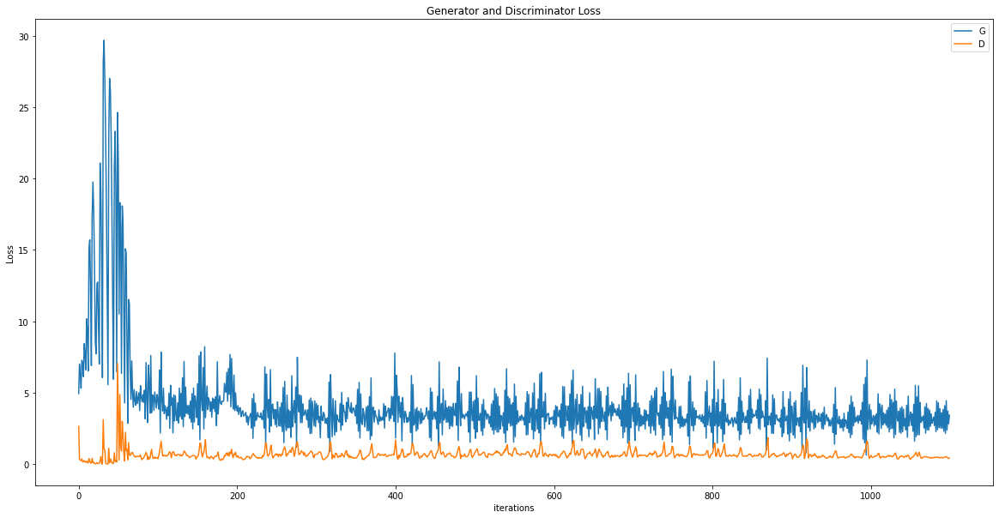

In [18]:
plt.figure(figsize=(20,10))
plt.title("Generator and Discriminator Loss")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

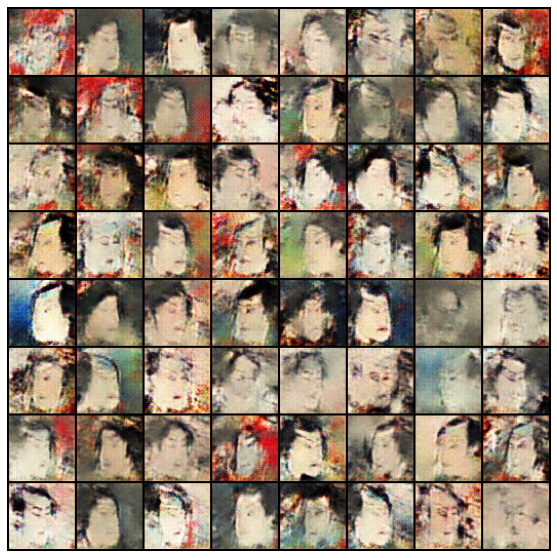

In [19]:

fig = plt.figure(figsize=(10,10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1500, repeat_delay=1500, blit=True)

HTML(ani.to_jshtml())

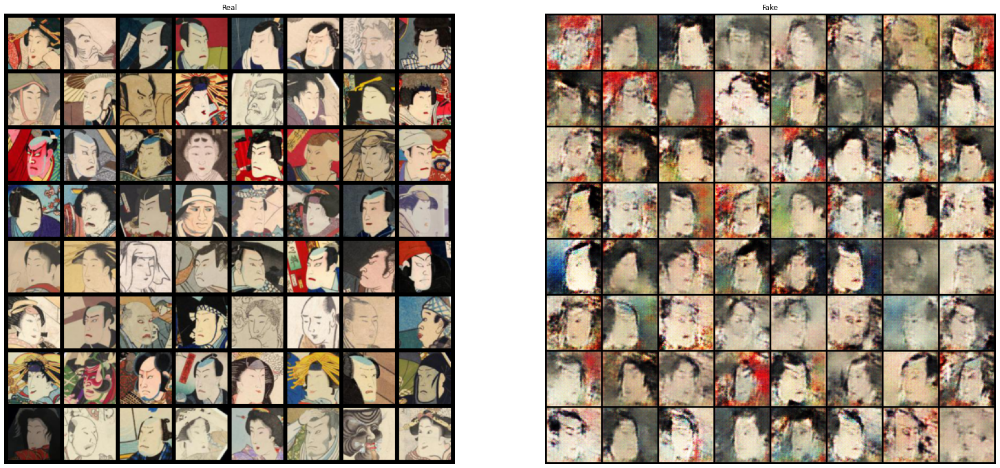

In [20]:
real_batch = next(iter(dataloader))


plt.figure(figsize=(30,30))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))


plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()